# Generative adversorial Network

In [1]:
import tensorflow as tf
from keras.layers import Conv2D, BatchNormalization, Input, GlobalAveragePooling2D, Dense, LeakyReLU, Conv2DTranspose, Reshape
from keras.models import Model
import pandas as pd
import os
from keras.optimizers import Adam
from keras import Sequential

import cv2
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
from IPython.display import clear_output
import PIL
import glob
import imageio

## Define the discriminator

In [2]:
# Function for the discriminator layers

def make_discriminator_block(start_filters, spatial_dim, filter_size):

    # function for building CNN block for downsapling the image
    def add_discriminator_block(x, filters, filter_size):
        x =  Conv2D(filters, filter_size, padding='same')(x)
        x = BatchNormalization()(x)
        x = Conv2D(filters, filter_size, padding='same', strides=2)(x)
        x = BatchNormalization()(x)
        x = LeakyReLU(0.3)(x)
        return x
    
    # imput is an image
    inpu = Input(shape=(spatial_dim, spatial_dim, 3))
    # design the discrimitor to downsample the image 4x
    x = add_discriminator_block(inpu, start_filters, filter_size)
    x = add_discriminator_block(x, start_filters * 2, filter_size)
    x = add_discriminator_block(x, start_filters * 4, filter_size)
    x = add_discriminator_block(x, start_filters * 8, filter_size)

    # Average and return a binary output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1)(x)
    model = Model(inputs=inpu, outputs=x)
    # compile discriminator
    # model.compile(loss='binary_crossentropy', optimizer=Adam(learning_rate=0.0002, beta_1=0.5), metrics=['accuracy'])
    return model


## Define the generator

In [3]:
# Building generator

def make_generator_block(start_filters, filter_size, latent_dim):

    # function for building a CNN block for upsampling the image

    def add_generator_block(x, filters, filter_size):
        x = Conv2DTranspose(filters, filter_size, strides=2, padding='same')(x)
        x = BatchNormalization()(x)
        x = LeakyReLU(0.3)(x)
        return x
    
    # input is a noise vector
    inpu = Input(shape=(latent_dim,))

    # projection of the noise vector into a tensor with 
    # same shape as last conv layer in discriminator
    x = Dense(4 * 4 * (start_filters * 8), input_dim=latent_dim)(inpu)
    x = BatchNormalization()(x)
    x = Reshape(target_shape=(4, 4, start_filters*8))(x)

      # design the generator to upsample the image 4x
    x = add_generator_block(x, start_filters * 4, filter_size)
    x = add_generator_block(x, start_filters * 2, filter_size)
    x = add_generator_block(x, start_filters, filter_size)
    x = add_generator_block(x, start_filters, filter_size)    

    # turn the output into a 3D tensor, an image with 3 channels 
    x = Conv2D(3, kernel_size=5, padding='same', activation='tanh')(x)
  
    return Model(inputs=inpu, outputs=x)


## Define some configurations parameters

In [4]:
# load celebrity images attributes
df_celeb = pd.read_csv('data/Celeb_Face/list_attr_celeba.csv')
TOTAL_SAMPLES = df_celeb.shape[0]

# we will downscale the images
SPATIAL_DIM = 64 
# size of noise vector
LATENT_DIM_GAN = 100 
# filter size in conv layer
FILTER_SIZE = 5
# number of filters in conv layer
NET_CAPACITY = 16
# batch size
BATCH_SIZE_GAN = 250
# interval for displaying generated images
PROGRESS_INTERVAL = 80 
# directory for storing generated images
ROOT_DIR = 'visualization'
if not os.path.isdir(ROOT_DIR):
    os.mkdir(ROOT_DIR)

2023-04-12 01:24:10.843426: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-04-12 01:24:10.843589: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Metal device set to: Apple M1 Pro

systemMemory: 32.00 GB
maxCacheSize: 10.67 GB



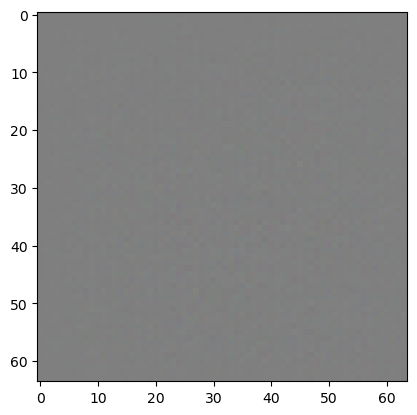

In [5]:
 ### generator
generator_celeb = make_generator_block(NET_CAPACITY, FILTER_SIZE, LATENT_DIM_GAN)
noise = np.random.randn(BATCH_SIZE_GAN, LATENT_DIM_GAN)
imgs_fake = generator_celeb(noise, training=False)
plt.imshow(imgs_fake[0, :, :, :] * 0.5 + 0.5) 

In [39]:
generator_celeb.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 100)]             0         
                                                                 
 dense (Dense)               (None, 2048)              206848    
                                                                 
 batch_normalization (BatchN  (None, 2048)             8192      
 ormalization)                                                   
                                                                 
 reshape (Reshape)           (None, 4, 4, 128)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 8, 8, 64)         204864    
 nspose)                                                         
                                                                 
 batch_normalization_1 (Batc  (None, 8, 8, 64)         256   

In [6]:
### discriminator
discriminator_celeb = make_discriminator_block(NET_CAPACITY, SPATIAL_DIM, FILTER_SIZE)

In [7]:
# This method returns a helper function to compute cross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [8]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

In [9]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [10]:
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)

In [11]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator_celeb,
                                 discriminator=discriminator_celeb)

In [12]:
EPOCHS = 50
noise_dim = LATENT_DIM_GAN
num_vis = min(BATCH_SIZE_GAN, 5)

# You will reuse this seed overtime (so it's easier)
# to visualize progress in the animated GIF)
seed = tf.random.normal([num_vis, noise_dim])

In [13]:
# Notice the use of `tf.function`
# This annotation causes the function to be "compiled".
@tf.function
def train_step(images):
        noise = tf.random.normal([BATCH_SIZE_GAN, noise_dim])

        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
         generated_images = generator_celeb(noise, training=True)

         real_output = discriminator_celeb(images, training=True)
         fake_output = discriminator_celeb(generated_images, training=True)

         gen_loss = generator_loss(fake_output)
         disc_loss = discriminator_loss(real_output, fake_output)

        gradients_of_generator = gen_tape.gradient(gen_loss, generator_celeb.trainable_variables)
        gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator_celeb.trainable_variables)

        generator_optimizer.apply_gradients(zip(gradients_of_generator, generator_celeb.trainable_variables))
        discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator_celeb.trainable_variables))
        return [disc_loss, gen_loss]

In [14]:
     # helper function for selecting 'size' real images
     # and downscaling them to lower dimension SPATIAL_DIM
def get_real_celebrity(df, size, ind_batch):
    
    if (ind_batch +1) * size > TOTAL_SAMPLES:
       
          end = TOTAL_SAMPLES
    else: 
          end = (ind_batch +1) * size
    cur_files = df.iloc[ind_batch * size: end]
    siz = cur_files.shape[0]
    X = np.empty(shape=(siz, SPATIAL_DIM, SPATIAL_DIM, 3))
    for i in range(0, siz):
          file = cur_files.iloc[i]
          img_uri = 'data/Celeb_Face/img_align_celeba/' + file.image_id
          img = cv2.imread(img_uri)
          img = cv2.resize(img, (SPATIAL_DIM, SPATIAL_DIM))
          img = np.flip(img, axis=2)
        # scale the image values between [-1 , 1]
          img = img.astype(np.float32)/127.5 - 1
          X[i] = img
    return X

In [15]:
def generate_and_save_images(model, epoch, test_input):
  # Notice `training` is set to False.
  # This is so all layers run in inference mode (batchnorm).
   predictions = model(test_input, training=False)
   vis_num = predictions.shape[0]
   fig = plt.figure(figsize=(vis_num * 3, 3))

   for i in range(vis_num):
     plt.subplot(1, vis_num, i + 1)
     plt.imshow(predictions[i, :, :, :] * 0.5 + 0.5)
     plt.axis('off')

   plt.savefig(os.path.join(ROOT_DIR,'image_' + str(epoch + 1).zfill(3) + '.jpg'), format='jpg', bbox_inches='tight')
   plt.show()

In [16]:
import time
def train(dataset, epochs):
  # list for storing loss
  avg_loss_discriminator = []
  avg_loss_generator = []
  for epoch in range(epochs):
    start = time.time()
       # list for storing loss
    loss_discriminator = []
    loss_generator = []
    num_steps = (TOTAL_SAMPLES + BATCH_SIZE_GAN -1)// BATCH_SIZE_GAN
    for st in range(num_steps):
      image_batch = get_real_celebrity(dataset, BATCH_SIZE_GAN, st)
      loss = train_step(image_batch)
      loss_discriminator.append(loss[0])
      loss_generator.append(loss[1])
      if st % 100 == 0:            
        print("Discriminator Training loss at step %d: %.5f" % (st+1, float(loss[0]))) 
        print("Generator Training loss at step %d: %.5f" % (st+1, float(loss[1]))) 
        # Only for CURRENT batch    
      print("Total seen samples: %d" % ((st + 1) * BATCH_SIZE_GAN))    

    # Produce images for the GIF as you go
    clear_output(wait=True)
    generate_and_save_images(generator_celeb,
                             epoch,
                             seed)

    # Save the model every 15 epochs
    if (epoch + 1) % 5 == 0:
      checkpoint.save(file_prefix = checkpoint_prefix)

    print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))


   # visualize loss
    avg_loss_discriminator.append(np.mean(loss_discriminator))
    avg_loss_generator.append(np.mean(loss_generator))
    plt.plot(range(len(avg_loss_discriminator)), avg_loss_discriminator)
    plt.plot(range(len(avg_loss_generator)), avg_loss_generator)
    plt.legend(['discriminator loss', 'generator loss'])
    plt.savefig(os.path.join(ROOT_DIR,'loss_' + str(epoch + 1).zfill(3) + '.jpg'), format='jpg', bbox_inches='tight')
    plt.show()
   # Generate after the final epoch
  clear_output(wait=True)
  generate_and_save_images(generator_celeb,
                           epochs,
                           seed)

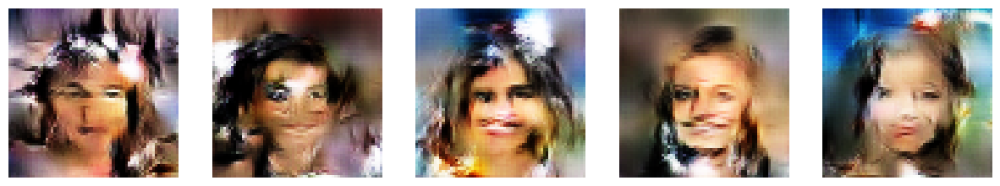

In [17]:
train(df_celeb,epochs=50)

In [19]:
# Display a single image using the total iteration number (multiple of PROGRESS_INTERVAL) 
def display_image(num_epoch):
  return PIL.Image.open(os.path.join(ROOT_DIR, str(num_epoch).zfill(3) + '.jpg'))

In [35]:
anim_file = 'Images_dcgan.gif'
frames = [PIL.Image.open(image) for image in glob.glob(f"{ROOT_DIR}/image*.jpg")]
frame_one = frames[0]
frame_one.save(anim_file, format="GIF", append_images=frames,
               save_all=True, duration=100, loop=0)

In [36]:
anim_file1 = 'Loss_dcgan.gif'
frames = [PIL.Image.open(image) for image in glob.glob(f"{ROOT_DIR}/loss*.jpg")]
frame_one = frames[0]
frame_one.save(anim_file1, format="GIF", append_images=frames,
               save_all=True, duration=100, loop=0)



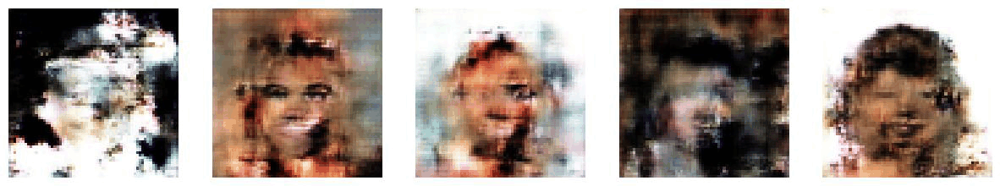

In [37]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)


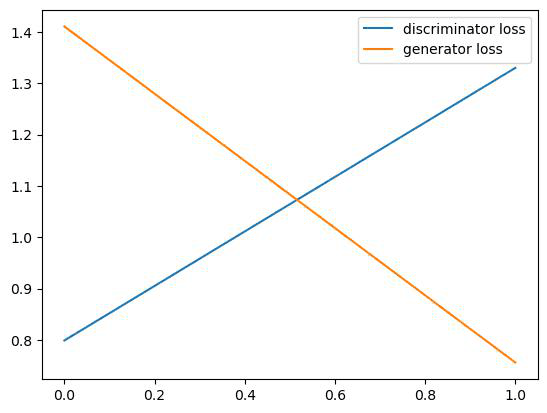

In [38]:
embed.embed_file(anim_file1)